In [1]:
library(rgdal)
library(raster)

library(transformeR)
library(downscaleR)
library(loadeR)
library(visualizeR)
library(climate4R.climdex)
library(plotly)

library(RColorBrewer)
colstx <- rev(brewer.pal(n = 9, "Spectral"))
colsindex <- rev(brewer.pal(n = 9, "RdYlBu"))
colsdelta <- brewer.pal(n = 9, "Reds")
colsbias <- brewer.pal(n = 9, "PiYG")
colssd <- brewer.pal(n = 9, "Blues")

Loading required package: sp

rgdal: version: 1.4-7, (SVN revision 845)
 Geospatial Data Abstraction Library extensions to R successfully loaded
 Loaded GDAL runtime: GDAL 2.2.3, released 2017/11/20
 Path to GDAL shared files: C:/R/library/rgdal/gdal
 GDAL binary built with GEOS: TRUE 
 Loaded PROJ.4 runtime: Rel. 4.9.3, 15 August 2016, [PJ_VERSION: 493]
 Path to PROJ.4 shared files: C:/R/library/rgdal/proj
 Linking to sp version: 1.3-2 

transformeR version 1.6.1 (2019-11-01) is loaded


Get the latest stable version (2.0.1) using <devtools::install_github('SantanderMetGroup/transformeR')>

Please see 'citation("transformeR")' to cite this package.

downscaleR version 3.1.0 (2019-07-09) is loaded


Get the latest stable version (3.3.1) using <devtools::install_github(c('SantanderMetGroup/transformeR','SantanderMetGroup/downscaleR'))>

Please use 'citation("downscaleR")' to cite this package.

Loading required package: rJava

Loading required package: loadeR.java

Java version 1.8x amd

# Comparion of observed meteo datasets
***

Using eight global datasets of observed meteorological data

1. Indian Meteorological Department (IMD) New High Spatial Resolution (0.25X0.25 degree) Long Period (1901-2018) Daily Gridded Rainfall Data Set Over India (Pai et al. 2014)

2. WFDEI.GPCC (Weedon et al. 2014) 25 WFD—Watch forcing data set: 0.5 3/6 hourly meteorological forcing from ECMRWF reanalysis (ERA40) bias-corrected and extrapolated by CRU TS and GPCP (rainfall) and corrections for under catch

3. CRU TS3.10 Dataset (Harris et al. 2014)

4. GSWP3 (Kim et al.)

5. PGMFD v.2 - Princeton (Sheffield et al. 2006)

6. MSWEP (Beck et al. 2017) 

7. Chirps (Funk et al. 2015)

8. AgMerra (Ruane et al. 2015)


- Pai et al. (2014). Pai D.S., Latha Sridhar, Rajeevan M., Sreejith O.P., Satbhai N.S. and Mukhopadhyay B., 2014: Development of a new high spatial resolution (0.25° X 0.25°)Long period (1901-2010) daily gridded rainfall data set over India and its comparison with existing data sets over the region; MAUSAM, 65, 1(January 2014), pp1-18. http://www.imdpune.gov.in/Clim_Pred_LRF_New/Grided_Data_Download.html

- Weedon, G. P., G. Balsamo, N. Bellouin, S. Gomes, M. J. Best and P. Viterbo (2014). “The WFDEI meteorological forcing data set: WATCH Forcing data methodology applied to ERA-Interim reanalysis data.” Water Resources Research 50(9): 7505-7514.

- Harris, I., Jones, P., Osborn, T. and Lister, D. (2014), Updated high‐resolution grids of monthly climatic observations – the CRU TS3.10 Dataset. Int. J. Climatol., 34: 623-642. doi:10.1002/joc.3711

- Kim, H., S. Watanabe, E.-C. Chang, K. Yoshimura, Y. Hirabayashi, J. Famiglietti and T. Oki “Century long observation constrained global dynamic downscaling and hydrologic implication [in preparation].

- Sheffield, J., G. Goteti and E. F. Wood (2006). “Development of a 50-year high-resolution global dataset of meteorological forcings for land surface modeling.” Journal of Climate 19(13): 3088-3111.

- Beck, H. E., A. I. J. M. Van Dijk, V. Levizzani, J. Schellekens, D. G. Miralles, B. Martens and A. De Roo (2017). “MSWEP: 3-hourly 0.25° global gridded precipitation (1979-2015) by merging gauge, satellite, and reanalysis data.” Hydrology and Earth System Sciences 21(1): 589-615.

- Funk, C., Peterson, P., Landsfeld, M. et al. The climate hazards infrared precipitation with stations—a new environmental record for monitoring extremes. Sci Data 2, 150066 (2015) doi:10.1038/sdata.2015.66

- Ruane, A.C., R. Goldberg, and J. Chryssanthacopoulos, 2015: AgMIP climate forcing datasets for agricultural modeling: Merged products for gap-filling and historical climate series estimation, Agr. Forest Meteorol., 200, 233-248, doi:10.1016/j.agrformet.2014.09.016

In [2]:
setwd("P:/watmodel/CWATM/upper_bhima/climate/gridded/observed_gridded_pr")
#Bhima
lon <- c(73, 77)
lat <- c(16, 20)

# define Mask
ubfile ="P:/watmodel/CWATM/upper_bhima/shapes/UB_line.shp"
ub <-shapefile(ubfile)
pols <-list("sp.lines",as(ub,'SpatialLines'), col = "red", lwd = 1.0)

mask = as.matrix(raster("P:/watmodel/CWATM/upper_bhima/shapes/ub3.tif"))
mask[is.na(mask)] = 0
# Flip mask upside down
mask <- apply(mask, 2, rev)
masksum = sum(mask)

In [3]:
ensemble.obs = c("IMD_pr_bhima2.nc","res25/pr_wfdei_025bil2.nc","res25/CRU_bhima_025.nc","res25/gswp3_bhima_025.nc","res25/pgfv21_bhima_025.nc","res25/mswep_bhima_025.nc","res25/chirps_bhima_025.nc","res25/agmerra_bhima_025x.nc")
ensemble.name = c("IMD","WFDEI","CRU","GSWP","PGFV2.1","MSWEP","CHIRPS","AgMerra")

prsim.list <- lapply(ensemble.obs, function(x) 
    loadGridData(dataset = x,
                 var = "pr",
                 lonLim = lon,
                 latLim = lat,
                 years = 1981:2005))
# kg -> mm
prsim.list <- lapply(prsim.list, function(x) gridArithmetics(x, 86400., operator = "*"))
prsim.ens <- bindGrid(prsim.list, dimension = "member")
prsim.ens$Members = ensemble.name

#---------------------- Mask out non catchment
nmodel = dim(prsim.ens$Data)[1]
ntime = dim(prsim.ens$Data)[2]
for (i in 1:nmodel){
  for (j in 1:ntime){
    prsim.ens$Data[i,j,,] = prsim.ens$Data[i,j,,] * mask
  }
}
#print ("Read all done")
#----------------------------

[2020-07-23 17:17:13] Defining geo-location parameters

[2020-07-23 17:17:13] Defining time selection parameters

[2020-07-23 17:17:13] Retrieving data subset ...

[2020-07-23 17:17:15] Done

[2020-07-23 17:17:18] Defining geo-location parameters

[2020-07-23 17:17:18] Defining time selection parameters

[2020-07-23 17:17:18] Retrieving data subset ...

[2020-07-23 17:17:20] Done

[2020-07-23 17:17:25] Defining geo-location parameters

[2020-07-23 17:17:25] Defining time selection parameters

[2020-07-23 17:17:25] Retrieving data subset ...

[2020-07-23 17:17:26] Done

[2020-07-23 17:17:29] Defining geo-location parameters

[2020-07-23 17:17:29] Defining time selection parameters

[2020-07-23 17:17:29] Retrieving data subset ...

[2020-07-23 17:17:32] Done

[2020-07-23 17:17:35] Defining geo-location parameters

[2020-07-23 17:17:35] Defining time selection parameters

[2020-07-23 17:17:35] Retrieving data subset ...

[2020-07-23 17:17:37] Done

[2020-07-23 17:17:40] Defining geo-locat

## Spatial distribution of precipitation

Climate Change Indices

The ETCCDI web page giving the definition of the 27 core indices:
http://etccdi.pacificclimate.org/list_27_indices.shtml



- Karl, T.R., N. Nicholls, and A. Ghazi, 1999: CLIVAR/GCOS/WMO workshop on indices and indicators for climate extremes: Workshop summary. Climatic Change, 42, 3-7.

- Peterson, T.C., and Coauthors: Report on the Activities of the Working Group on Climate Change Detection and Related Rapporteurs 1998-2001. WMO, Rep. WCDMP-47, WMO-TD 1071, Geneve, Switzerland, 143pp.




### Annual precipitation [mm/a]

[2020-07-23 17:18:22] Calculating PRCPTOT ...

[2020-07-23 17:20:08] Done

[2020-07-23 17:20:09] Calculating CDD ...

[2020-07-23 17:21:53] Done

[2020-07-23 17:21:53] Calculating R10mm ...

[2020-07-23 17:23:36] Done

[2020-07-23 17:23:36] - Computing climatology...

[2020-07-23 17:23:36] - Done.



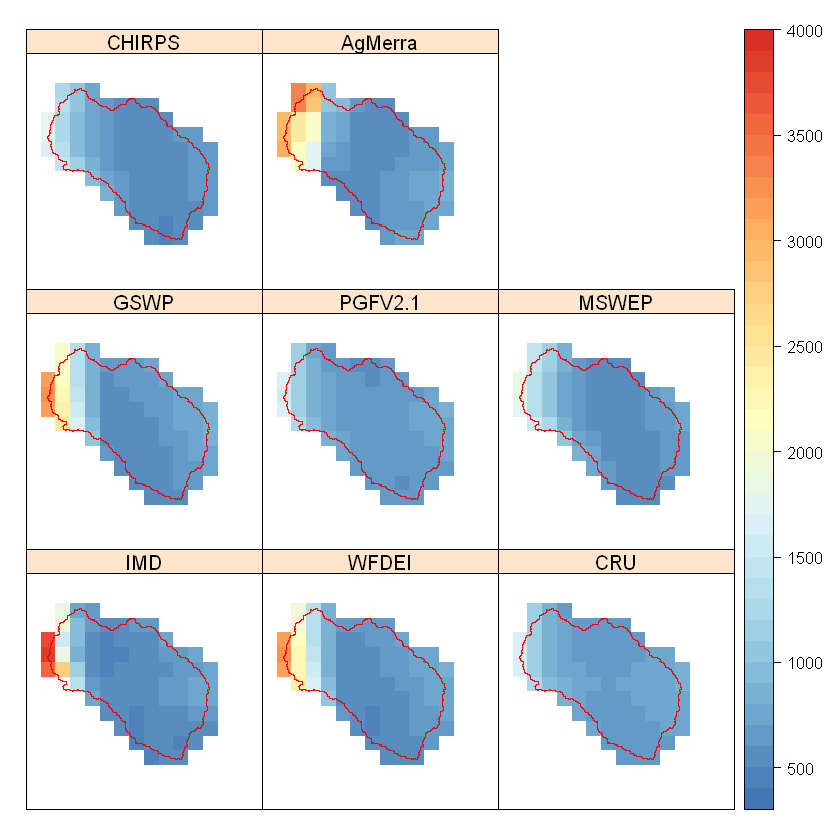

In [4]:
# Plot a spatial map
#spatialPlot(climatology(prsim.ens), sp.layout=pols,col.regions = colorRampPalette(colssd))

# Annual_total_precipitation_in_wet_da
pr1.ens <- climdexGrid(pr = prsim.ens, index.code = "PRCPTOT")
  #  	Maximum_length_of_dry_spell 
pr2.ens <- climdexGrid(pr = prsim.ens, index.code = "CDD")
pr3.ens <- climdexGrid(pr = prsim.ens, index.code = "R10mm")

# ##Annual precipitation
spatialPlot(climatology(pr1.ens), sp.layout=pols,at = seq(300, 4000, 100),col.regions = colorRampPalette(colsindex))



### Consecutive Dry Days (CDD) [days]

Maximum length of dry spell, maximum number of consecutive days with RR < 1mm

[2020-04-24 10:23:42] - Computing climatology...

[2020-04-24 10:23:42] - Done.



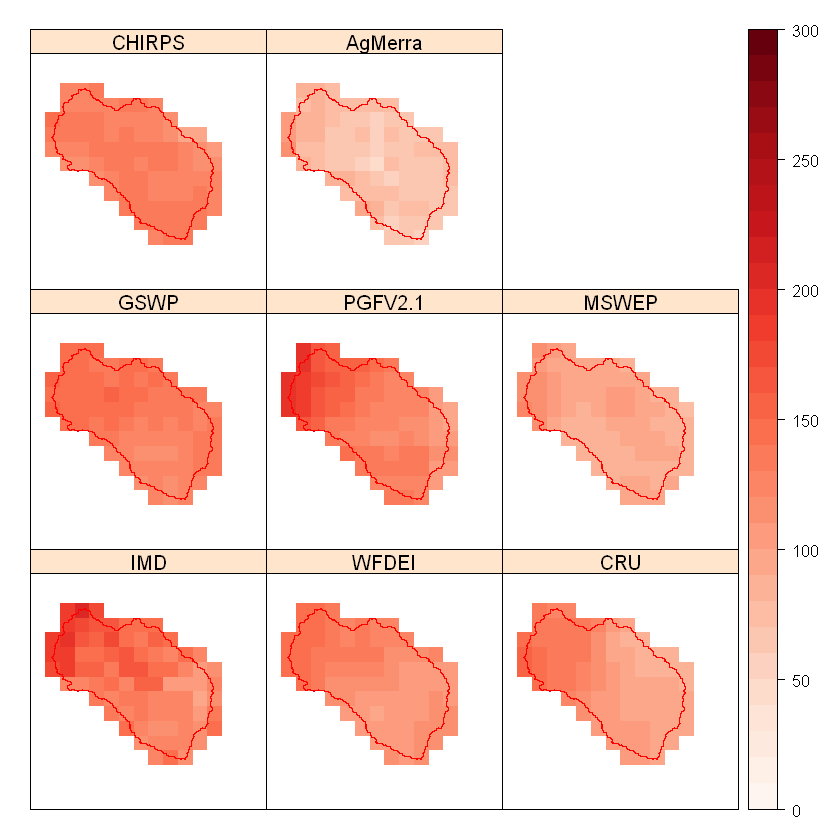

In [6]:
spatialPlot(climatology(pr2.ens), sp.layout=pols,at = seq(0, 300, 10),col.regions = colorRampPalette(colsdelta))

### Days with more than 10 mm rain (R10mm) [days]

Annual count of days when PRCP≥ 10mm

[2020-04-24 10:23:46] - Computing climatology...

[2020-04-24 10:23:46] - Done.



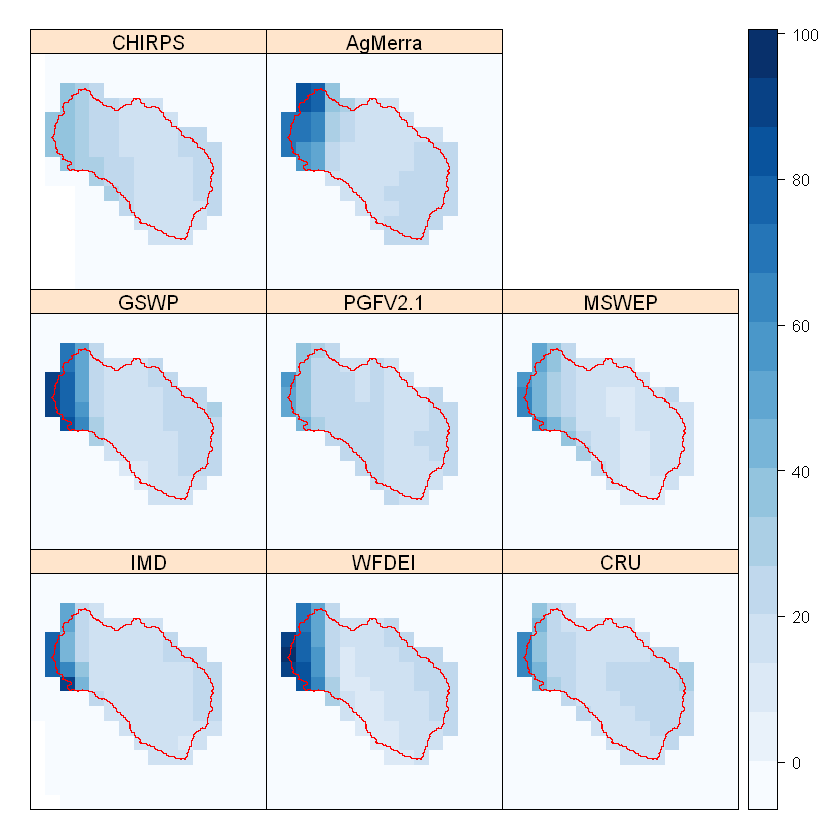

In [7]:
spatialPlot(climatology(pr3.ens), sp.layout=pols,col.regions = colorRampPalette(colssd))

## Time series spatially aggregated for the UB basin

### Annual sum of precipitation [mm]

Averaged for the Upper Bhima basin

In [8]:
prsim_ann.list <- lapply(prsim.list, function(x) aggregateGrid(x, aggr.y = list(FUN = "sum")))
prsim_ann.ens <- bindGrid(prsim_ann.list, dimension = "member")

aggr.fun <- list(FUN = "sum", na.rm = TRUE)
st1 =  aggregateGrid(prsim.ens, aggr.lat = aggr.fun, aggr.lon = aggr.fun)
st1 = gridArithmetics(st1, masksum, operator = "/")


d =st1$Dates$start
d1 =as.Date(as.POSIXct(d))

c1 = aggregateGrid(st1, aggr.y = list(FUN = "sum", na.rm = TRUE))
d =c1$Dates$end
d1 =as.Date(as.POSIXct(d))



data = data.frame(d1,c1$Data[1:5,,1,1])
p = plot_ly(data, x = ~d1, y = ~c1$Data[1,,1,1], name = 'IMD', type = 'scatter', mode = 'lines', 
            line = list(color = "black",width = 3))  %>%
  add_trace(y = ~c1$Data[2,,1,1], name = 'WFDEI', mode = 'lines',line = list(color = "blue",width = 3))   %>%
  add_trace(y = ~c1$Data[3,,1,1], name = 'CRU', mode = 'lines',line = list(color = "red",width = 1))   %>%
  add_trace(y = ~c1$Data[4,,1,1], name = 'GSWP', mode = 'lines',line = list(color = "red",width = 1, dash = 'dash'))   %>%
  add_trace(y = ~c1$Data[5,,1,1], name = 'PGFV2.1', mode = 'lines',line = list(color = "red",width = 1, dash = 'dot'))   %>%
  add_trace(y = ~c1$Data[6,,1,1], name = 'MSWEP', mode = 'lines',line = list(color = "green",width = 1))   %>%
  add_trace(y = ~c1$Data[7,,1,1], name = 'CHIRPS', mode = 'lines',line = list(color = "green",width = 1, dash = 'dash'))   %>%
  add_trace(y = ~c1$Data[8,,1,1], name = 'AgMerra', mode = 'lines',line = list(color = "green",width = 1, dash = 'dot'))   %>%
  
  
  layout(title = "Annual Precipitation of different datasets",
       xaxis = list(title = "Years"),
       yaxis = list (title = "Annual Sum Precipitation [mm]"))

embed_notebook(p)

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:53] Done.

[2020-04-24 10:23:53] Performing annual aggregation...

[2020-04-24 10:23:54] Done.

Calculating areal weights...

[2020-04-24 10:23:54] - Aggregating lat dimension...

[2020-04-24 10:23:56] - Done.

[2020-04-24 10:23:56] - Aggregating lon dimension...

[2020-04-24 10:23:56] - Done.

[2020-04-24 10:23:56] Performing annual aggregation...

[2020-04-24 10:23:56] Done.



<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

### Annual monthly cycle of precipitation [mm]

Averaged for the Upper Bhima basin, averaged from 1985-2005 for each month

In [9]:
mst1 = aggregateGrid(st1, aggr.m = list(FUN = "sum", na.rm = TRUE))
c3 <- temporalCycleGrid(mst1, time.frame = "monthly")
#plot(c3$Data[,1], ty = 'l')
# https://rdrr.io/github/SantanderMetGroup/transformeR/man/temporalCycleGrid.html

month <- c('Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul','Aug', 'Sep', 'Oct', 'Nov', 'Dec')
#month = c(1,2,3,4,5,6,7,8,9,10,11,12)

data = data.frame(month,c3$Data[,1:5])
data$month <- factor(data$month, levels = data[["month"]])

p = plot_ly(data, x = ~month, y = ~c3$Data[,1], name = 'IMD', type = 'scatter', mode = 'lines', 
            line = list(color = "black",width = 3))  %>%
  add_trace(y = ~c3$Data[,2], name = 'WFDEI', mode = 'lines',line = list(color = "blue",width = 3))   %>%
  add_trace(y = ~c3$Data[,3], name = 'CRU', mode = 'lines',line = list(color = "red",width = 1))   %>%
  add_trace(y = ~c3$Data[,4], name = 'GSWP', mode = 'lines',line = list(color = "red",width = 1, dash = 'dash'))   %>%
  add_trace(y = ~c3$Data[,5], name = 'PGFV2.1', mode = 'lines',line = list(color = "red",width = 1, dash = 'dot'))   %>%
  add_trace(y = ~c3$Data[,6], name = 'MSWEP', mode = 'lines',line = list(color = "green",width = 1))   %>%
  add_trace(y = ~c3$Data[,7], name = 'CHIRPS', mode = 'lines',line = list(color = "green",width = 1, dash = 'dash'))   %>%
  add_trace(y = ~c3$Data[,8], name = 'AgMerra', mode = 'lines',line = list(color = "green",width = 1, dash = 'dot'))   %>%
  layout(title = "Yearly Circle 19985-2005 of Precipitation",
       xaxis = list(title = "Month"),
       yaxis = list (title = "Avg. monthly sum Precipitation [mm]"))

embed_notebook(p)


[2020-04-24 10:24:23] Performing monthly aggregation...

[2020-04-24 10:24:23] Done.

[2020-04-24 10:24:23] - Calculating temporal cycle...

[2020-04-24 10:24:23] - Done.



<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

### Monthly sum of precipitation [mm]

Averaged for the Upper Bhima basin

In [10]:
prsim_m.list <- lapply(prsim.list, function(x) aggregateGrid(x, aggr.m = list(FUN = "sum")))
prsim_m.ens <- bindGrid(prsim_m.list, dimension = "member")

nmodel = dim(prsim_m.ens$Data)[1]
ntime = dim(prsim_m.ens$Data)[2]
for (i in 1:nmodel){
  for (j in 1:ntime){
    prsim_m.ens$Data[i,j,,] = prsim_m.ens$Data[i,j,,] * mask
    
  }
}

stm =  aggregateGrid(prsim_m.ens, aggr.lat = aggr.fun, aggr.lon = aggr.fun)
stm = gridArithmetics(stm, masksum, operator = "/")

startm = 1
#startm = 228
c1 = stm$Data[1,startm:300,1,1]
c2 = stm$Data[2,startm:300,1,1]
c3 = stm$Data[3,startm:300,1,1]
c4 = stm$Data[4,startm:300,1,1]
c5 = stm$Data[5,startm:300,1,1]
c6 = stm$Data[6,startm:300,1,1]
c7 = stm$Data[7,startm:300,1,1]
c8 = stm$Data[8,startm:300,1,1]
                       
d =stm$Dates$end
d1 =as.Date(as.POSIXct(d))
d1 = d1[startm:300]
             
data = data.frame(d1,c1,c2,c3,c4,c5,c6,c7,c8)

p = plot_ly(data, x = ~d1, y = ~c1, name = 'IMD', type = 'scatter', mode = 'lines', 
            line = list(color = "black",width = 3))  %>%
  add_trace(y = ~c2, name = 'WFDEI', mode = 'lines',line = list(color = "blue",width = 3))   %>%
  add_trace(y = ~c3, name = 'CRU', mode = 'lines',line = list(color = "red",width = 1))   %>%
  add_trace(y = ~c4, name = 'GSWP', mode = 'lines',line = list(color = "red",width = 1, dash = 'dash'))   %>%
  add_trace(y = ~c5, name = 'PGFV2.1', mode = 'lines',line = list(color = "red",width = 1, dash = 'dot'))   %>%
  add_trace(y = ~c6, name = 'MSWEP', mode = 'lines',line = list(color = "green",width = 1))   %>%
  add_trace(y = ~c7, name = 'CHIRPS', mode = 'lines',line = list(color = "green",width = 1, dash = 'dash'))   %>%
  add_trace(y = ~c8, name = 'AgMerra', mode = 'lines',line = list(color = "green",width = 1, dash = 'dot'))   %>%
  
  layout(title = "Monthly Precipitation of different datasets",
       xaxis = list(title = "Month"),
       yaxis = list (title = "Monthly Sum Precipitation [mm]")) 


embed_notebook(p)                      


[2020-04-24 10:24:35] Performing monthly aggregation...

[2020-04-24 10:24:35] Done.

[2020-04-24 10:24:35] Performing monthly aggregation...

[2020-04-24 10:24:35] Done.

[2020-04-24 10:24:36] Performing monthly aggregation...

[2020-04-24 10:24:36] Done.

[2020-04-24 10:24:36] Performing monthly aggregation...

[2020-04-24 10:24:36] Done.

[2020-04-24 10:24:36] Performing monthly aggregation...

[2020-04-24 10:24:36] Done.

[2020-04-24 10:24:36] Performing monthly aggregation...

[2020-04-24 10:24:36] Done.

[2020-04-24 10:24:36] Performing monthly aggregation...

[2020-04-24 10:24:37] Done.

[2020-04-24 10:24:37] Performing monthly aggregation...

[2020-04-24 10:24:37] Done.

Calculating areal weights...

[2020-04-24 10:24:37] - Aggregating lat dimension...

[2020-04-24 10:24:37] - Done.

[2020-04-24 10:24:37] - Aggregating lon dimension...

[2020-04-24 10:24:37] - Done.



<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

### Table with climatic indices


| -         | IMD | WFDEI | CRU | GSWP | PGFV2.1 | MSWEP | CHIRPS | AgMerra |
|-----------|-----|-------|-----|------|---------|-------|--------|---------|
| Rx5day    | 40  | 34    | 33  | 38   | 33      | 30    | 34     | 43      |
| SDII      | 12  | 8     | 7   | 9    | 14      | 6     | 11     | 11      |
| R20mm     | 12  | 10    | 6   | 12   | 11      | 6     | 9      | 14      |
| CDD       | 209 | 217   | 217 | 218  | 218     | 217   | 180    | 217     |
| CWD       | 13  | 33    | 37  | 32   | 13      | 33    | 10     | 13      |
| R95pTOT   | 223 | 187   | 170 | 207  | 183     | 171   | 158    | 217     |
| PRCPTOT   | 856 | 893   | 781 | 914  | 746     | 759   | 721    | 989     |
| sd_month  | 91  | 94    | 83  | 97   | 83      | 77    | 76     | 102     |
| 95%_month | 255 | 264   | 224 | 271  | 224     | 218   | 201    | 298     |
| 99%_month | 312 | 341   | 310 | 350  | 310     | 284   | 282    | 358     |


http://etccdi.pacificclimate.org/list_27_indices.shtml

- Rx5day: Monthly maximum consecutive 5-day precipitation

- SDII: Simple pricipitation intensity index

- R20mm: Annual count of days when PRCP≥ 20mm

- CDD: Maximum length of dry spell, maximum number of consecutive days with RR < 1mm

- CWD: Maximum length of wet spell, maximum number of consecutive days with RR ≥ 1mm

- R95pTOT: Annual total PRCP when RR > 95p

- PRCPTOT:	Annual total precipitation in wet days

- sd_month: Standard dev monthly aggregated values

- 95%_month: 99% percentile dev monthly aggregated values

- 99%_month: 95% percentile dev monthly aggregated values
